## Analise de Resultados
***

In [1]:
#Lista de Packages Utilizados:

import pandas as pd
import numpy as np
import datetime as dt
import itertools

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics

from math import sqrt
from math import pi


%matplotlib inline

In [2]:
#Importar File Pickle:

df_results = pd.read_pickle('Results_Proj_2018.pkl')
df_results.sample(5)

,DATA,FORECAST,REAL
V07,2018-10-14 23:00:00,"[1.8951389510055894, 1.95750745633096, 2.00572...","[1.0, 2.0, 1.0, 1.0, 3.0, 3.0, 1.0, 2.0, 2.0, ..."
TL2,2018-12-07 23:00:00,"[0.8062298489922243, 1.1467324979958504, 1.290...","[0.0, 3.0, 1.0, 3.0, 3.0, 0.0, 0.0, 0.0, 0.0, ..."
V11,2018-04-09 15:00:00,"[1.4790459699959082, 1.7206826535388875, 1.879...","[0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 2.0, 2.0, 2.0, ..."
V05,2018-08-11 23:00:00,"[1.3086487663310908, 1.375448619345204, 1.4253...","[1.0, 1.0, 3.0, 3.0, 3.0, 4.0, 4.0, 3.0, 4.0, ..."
TL1,2018-07-09 15:00:00,"[0.9160954351078968, 0.952578448788188, 0.9793...","[0.0, 1.0, 2.0, 2.0, 1.0, 3.0, 2.0, 1.0, 1.0, ..."


In [3]:
#Main Figures:

df_results.info()

<class 'pandas.core.frame.DataFrame'>
Index: 16960 entries, AM1 to V12
Data columns (total 3 columns):
DATA        16960 non-null datetime64[ns]
FORECAST    16960 non-null object
REAL        16960 non-null object
dtypes: datetime64[ns](1), object(2)
memory usage: 530.0+ KB


In [4]:
#Excluir Turnos Invalidos:

print(df_results[df_results['FORECAST']==0].shape)

df_results = df_results[df_results['FORECAST'] != 0]

(568, 3)


In [5]:
#Create Array:

maq = df_results.index.unique().to_list()

In [6]:
#Check Resultados:

result = {}
for i in range(len(maq)):
    a = df_results.loc[(df_results.index ==maq[i])][['FORECAST','REAL']]

    real = list(itertools.chain.from_iterable(a['REAL']))
    forecast = list(itertools.chain.from_iterable(a['FORECAST']))[:len(list(itertools.chain.from_iterable(a['REAL'])))]

    rmse = sqrt(metrics.mean_squared_error(real,forecast))
    acc = round((100 - abs((float(sum(forecast)) / float(sum(real)))-1)*100) , 3)

    result[maq[i]] = [real,forecast, acc, rmse]

df_model =  pd.DataFrame.from_dict(result, orient='index', columns=['real','forecast','acc','rmse'])

In [7]:
df_model

,real,forecast,acc,rmse
AM1,"[0.0, 4.0, 5.0, 3.0, 5.0, 5.0, 6.0, 6.0, 4.0, ...","[4.679174438442254, 4.477163713365294, 4.33862...",92.097,2.406684
AM2,"[6.0, 4.0, 3.0, 3.0, 6.0, 5.0, 6.0, 6.0, 5.0, ...","[2.113275712990679, 2.621834341920507, 2.97276...",97.679,2.392181
AM3,"[2.0, 7.0, 5.0, 3.0, 6.0, 1.0, 6.0, 6.0, 1.0, ...","[3.6517827569560297, 3.7298560685632083, 3.800...",97.326,2.330503
AM4,"[0.0, 5.0, 3.0, 5.0, 6.0, 5.0, 6.0, 5.0, 4.0, ...","[3.488323883302431, 3.867727633359576, 3.97195...",98.447,2.203915
TL1,"[1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.4018674651589706, 1.121952095264266, 0.9909...",97.685,1.102190
TR1,"[0.0, 1.0, 1.0, 1.0, 0.0, 2.0, 1.0, 1.0, 0.0, ...","[1.211560019472525, 1.151977853385096, 1.10458...",95.983,0.927052
TR2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 2.0, ...","[0.6629384378780759, 0.6170905887389204, 0.584...",98.254,0.986643
V01,"[1.0, 1.0, 4.0, 3.0, 1.0, 2.0, 4.0, 2.0, 3.0, ...","[2.1696355142582533, 2.2257857324617567, 2.273...",97.339,1.459781
V02,"[3.0, 2.0, 4.0, 4.0, 4.0, 4.0, 4.0, 3.0, 4.0, ...","[2.3185890626320496, 2.40810638253574, 2.48326...",97.422,1.417340
V03,"[2.0, 4.0, 3.0, 4.0, 4.0, 4.0, 3.0, 4.0, 4.0, ...","[1.9597588239945865, 2.433006214534209, 2.6663...",95.861,1.619850


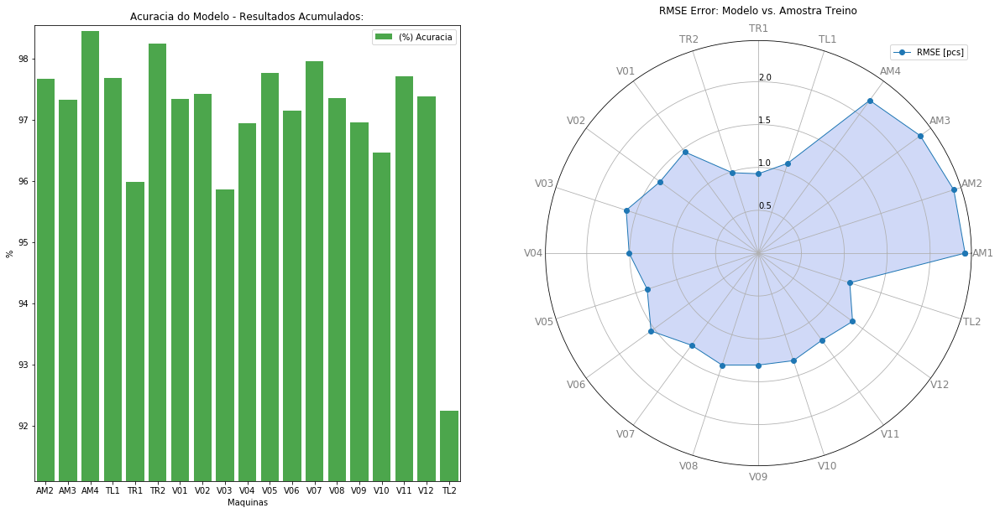

In [8]:
#Plot Gráficos de Resultados e RMSE - Período Acumulado:

fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(20,10))
fig.subplots_adjust(hspace =.2, wspace=.2)

#Grafico Acuracia:

_= ax[0].bar(df_model.index, df_model['acc'],linewidth=.8, alpha = 0.7, color='green')

_= ax[0].set_ylim((df_model['acc'].min()-1),(df_model['acc'].max()+0.1))
_= ax[0].set_xlim(0.5,df_model.index.size-0.5)

_= ax[0].set_title('Acuracia do Modelo - Resultados Acumulados:')
_= ax[0].set_xlabel('Maquinas')
_= ax[0].set_ylabel('%')
_= ax[0].legend(['(%) Acuracia'],loc='best')


#Grafico RMSE:

angles = [n / float(df_model.index.size) * 2 * pi for n in range(df_model.index.size)]
angles += angles[:1]

values= values = list(df_model['rmse'])
values += values[:1]

ax = plt.subplot(122, polar=True)
_= plt.xticks(angles[:-1], df_model.index.tolist(), color='grey', size=12)

_= ax.set_rlabel_position(90)

_= ax.plot(angles, values, linewidth=1, marker='o', linestyle='solid', label='RMSE [pcs]')
_= ax.fill(angles, values, 'b', alpha=0.1)

_= ax.fill(angles, values, alpha=0.1)

_= ax.set_title('RMSE Error: Modelo vs. Amostra Treino')
_= ax.legend(loc='best')

plt.savefig('rmse.png', bbox_inches='tight')

In [9]:
df_model.head()

,real,forecast,acc,rmse
AM1,"[0.0, 4.0, 5.0, 3.0, 5.0, 5.0, 6.0, 6.0, 4.0, ...","[4.679174438442254, 4.477163713365294, 4.33862...",92.097,2.406684
AM2,"[6.0, 4.0, 3.0, 3.0, 6.0, 5.0, 6.0, 6.0, 5.0, ...","[2.113275712990679, 2.621834341920507, 2.97276...",97.679,2.392181
AM3,"[2.0, 7.0, 5.0, 3.0, 6.0, 1.0, 6.0, 6.0, 1.0, ...","[3.6517827569560297, 3.7298560685632083, 3.800...",97.326,2.330503
AM4,"[0.0, 5.0, 3.0, 5.0, 6.0, 5.0, 6.0, 5.0, 4.0, ...","[3.488323883302431, 3.867727633359576, 3.97195...",98.447,2.203915
TL1,"[1.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[1.4018674651589706, 1.121952095264266, 0.9909...",97.685,1.102190


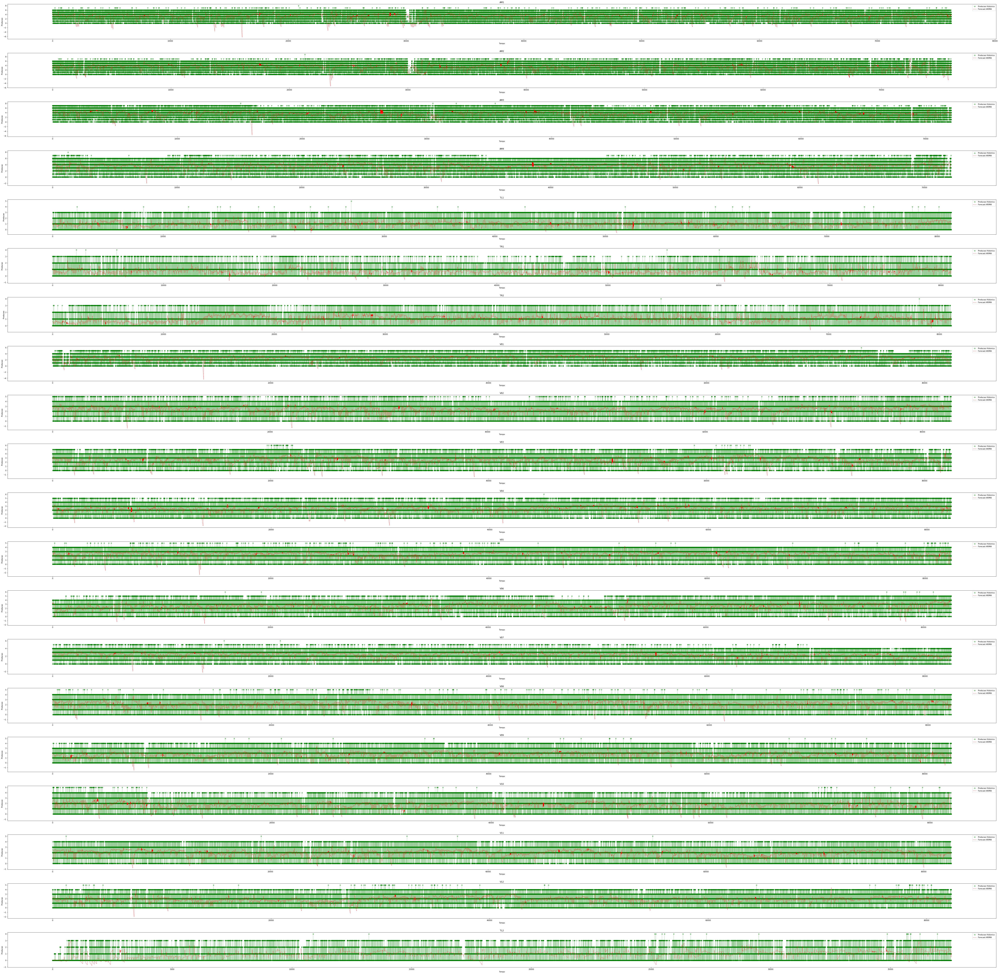

In [10]:
#Save Fig:

fig, ax = plt.subplots(nrows=len(maq), ncols=1, figsize=(100,100))
fig.subplots_adjust(hspace =.4, wspace=.4)

for i in range(len(maq)):
    stop = len(list(itertools.chain.from_iterable(df_model.loc[(df_model.index == maq[i])]['real'])))
    x = np.arange(0,stop)

    y_real = list(itertools.chain.from_iterable(df_model.loc[(df_model.index == maq[i])]['real']))
    y_forecast = list(itertools.chain.from_iterable(df_model.loc[(df_model.index == maq[i])]['forecast']))

    
    
    ax[i].plot(x, y_real, color='green', marker='o', linestyle='dashed', linewidth = 0.8, label='Producao Historica', alpha = 0.4)
    ax[i].plot(x, y_forecast, color='red', linestyle='dashdot', linewidth = 0.8, label='Forecast ARIMA')

    ax[i].set_title(str(maq[i]))
    ax[i].set_xlabel('Tempo')
    ax[i].set_ylabel('Producao')
    ax[i].legend(loc='best')

plt.savefig('all_graphs.png', bbox_inches='tight')

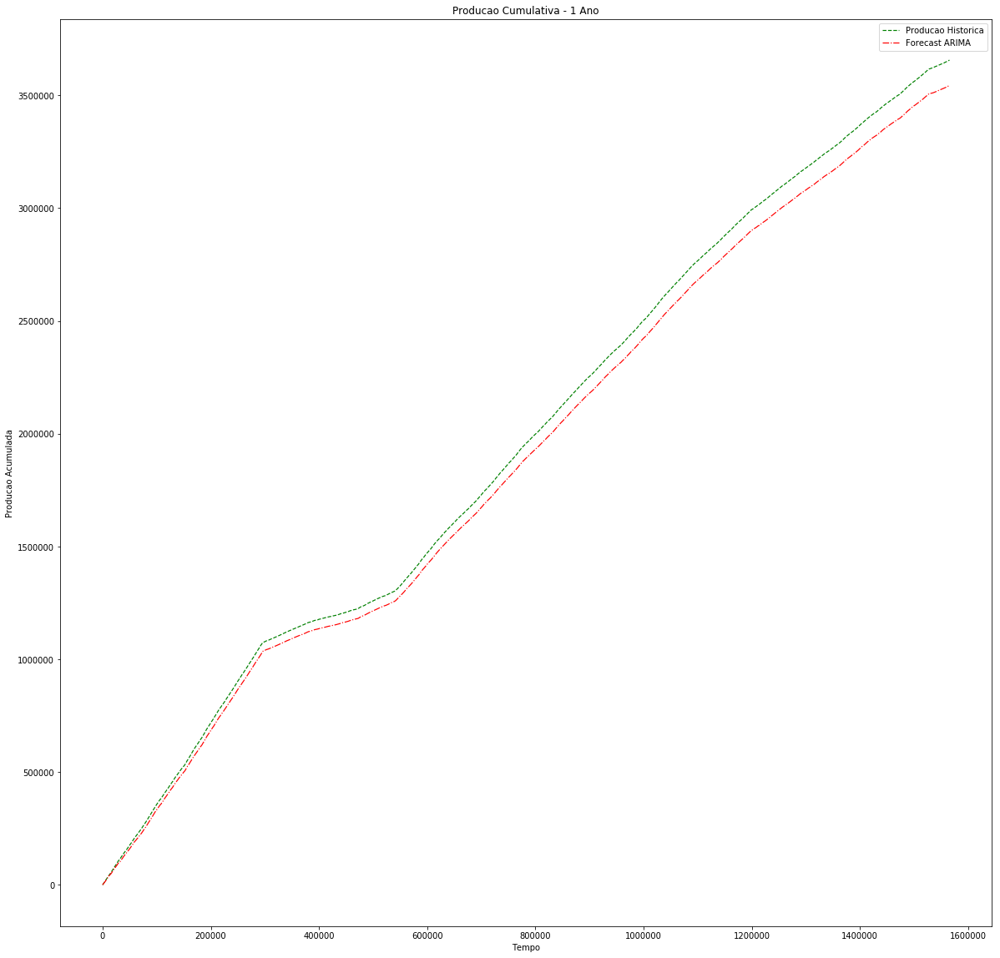

In [24]:
#Cumulative Graph:

fig = plt.figure(figsize=(20,20))

real = np.cumsum(list(itertools.chain.from_iterable(df_model['real'])))
forecast = np.cumsum(list(itertools.chain.from_iterable(df_model['forecast'])))

stop = len(real)

x = np.arange(0,stop)

_= plt.plot(x, real, color='green', linestyle='dashed', linewidth = 1.2, label='Producao Historica')
_= plt.plot(x, forecast, color='red', linestyle='dashdot', linewidth = 1.2, label='Forecast ARIMA')

_= plt.title('Producao Cumulativa - 1 Ano')
_= plt.xlabel('Tempo')
_= plt.ylabel('Producao Acumulada')
_= plt.legend(loc='best')

plt.savefig('cum_prod_1ano.png', bbox_inches='tight')